Презентация: https://disk.yandex.ru/i/IcZ1vrSLxUeNHg

Проект выполнила: Лисина Татьяна Александровна  
Дата: 17.02.2023  
Контактные данные: +37444433077 , bestearthman@yandex.ru

**ЗАДАЧА ПРОЕКТА:**  

Исследование рынка Москвы в сфере общественного питания, составление рекомендаций для инвестирования в новое заведение. 

**Ход исследования:**  
-  Выгрузим и обработаем данные - удалим дубликаты, проверим пропуски и при возможности заменим их, создадим при необходимости новые столбцы, оценим аномалии и качество данных.
-  Проанализируем данные - изучим все категории и посмотрим на их соотношение между собой, соотношение по сетям, выявим лидеров, посмотрим местоположение на карте, зависимости рейтингов от места, зависимость среднего чека.
-  Рассмотрим категорию кофейни для открытия бизнеса - изучим все имеющися кофейни, их топ, местоположение по городу, среднюю стоимость капучино и дадим рекомендации.

### ОБЩАЯ ИНФОРМАЦИЯ

In [1]:
import pandas as pd
import numpy as np
import datetime as dt
from matplotlib import pyplot as plt
from matplotlib.pyplot import figure
import scipy.stats as stats
from plotly import graph_objects as go
import plotly.express as px
import seaborn as sns

!pip install folium
from folium import Map, Choropleth
from folium.plugins import MarkerCluster
from folium import Marker, Map
import json

import warnings
warnings.filterwarnings("ignore")

Defaulting to user installation because normal site-packages is not writeable


In [2]:
try:
    data = pd.read_csv('/datasets/moscow_places.csv')
except:
    data = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')
    
display(data)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


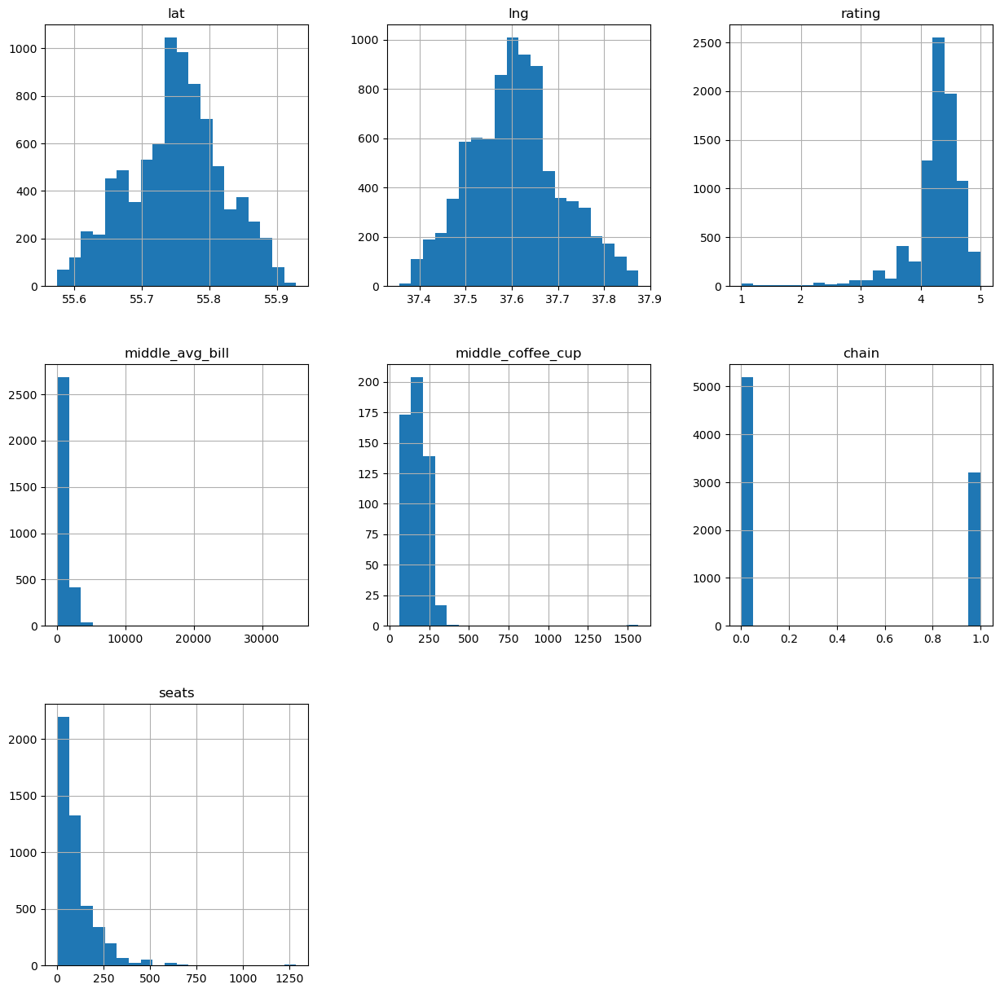

In [4]:
data.hist(bins=20, figsize=(15, 15));

На быстрых гистограммах (по необработанным данным) видно:
- наблюдается нормальное распределение метоположения заведений с большей плотностью в центре Москвы (д.55.75°, ш.37.62°)
- средний рейтинг заведений 4,3 балла (по медиане)
- средняя стоимость чашки кофе около 200 р.
- средний чек заведений менее 2000 р.
- количество мест в заведении в большинстве случаев менее 100
- больше несетевых заведений, чем сетевых (примерное соотношение 3/2)

### ПРЕДОБРАБОТКА ДАННЫХ

#### Дубликаты

In [5]:
data.duplicated().sum()

0

Явных дубликатов в данных нет.

In [6]:
names = data['name'].nunique()
names

5614

Избавимся от неявных дубликатов в названиях заведений.

In [7]:
data['name'] = data['name'].str.lower()

In [8]:
names = data['name'].nunique()
names

5512

Мы избавились от сотни дубликатов в названиях.

In [9]:
unic_name = data.name.nunique()       # всего заведений
chain = data.loc[data['chain'] != 0]  # сетевые
chain_unic = chain['name'].nunique()  # сетевые уникальные
print('\033[1m' + 'Всего', unic_name, 'уникальных брендов общественного питания, из них', chain_unic, 'сетевых.' + '\033[0m')

Всего 5512 уникальных брендов общественного питания, из них 747 сетевых.


#### Пропуски

In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Есть пропуски в 6 столбцах. К сожалению, мы не можем их заполнить, поэтому оставим как еть. Наиболее важный столбец с пропускками - это средний чек заведения middle_avg_bill, посмотрим далее равномерно ли распределены данные по категориям, чтобы его использовать.

#### Новые столбцы

Дополним таблицу столбцами с названием улицы и круглосуточным режимом работы.

In [11]:
data['street'] = data['address'].apply(lambda x: x.split(',')[1]).str.strip()

In [12]:
# data['is_24/7'] = data['hours'].str.split(',', expand=True)[1]

In [13]:
data['is_24/7'] = np.where(data['hours'] == 'ежедневно, круглосуточно', True, False)

In [14]:
data = data.reindex(columns=['name', 'category', 'address', 'street', 'district', 'hours', 'is_24/7', 'lat', 'lng',
       'rating', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup',
       'chain', 'seats'])

In [15]:
data.head(3)

,name,category,address,street,district,hours,is_24/7,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",улица Дыбенко,Северный административный округ,"ежедневно, 10:00–22:00",False,55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",улица Дыбенко,Северный административный округ,"ежедневно, 10:00–22:00",False,55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,хазри,кафе,"Москва, Клязьминская улица, 15",Клязьминская улица,Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",False,55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0


В данных также есть проблемы:
- Неверно указанные категории сетевых заведений
- Заведения, которые не являютсяя сетями (в единственном количестве)
- Мало и неверно заполненные данные по среднему чеку заведения и чашки кофе
- Выбросы в количестве мест
- Неявные дубликаты, которые сложно выявить малозатратными методами  

Будем это учитывать по ходу анализа.

Сократим для удобства длинное название заведения:

In [16]:
data.loc[data['name'] == 'кулинарная лавка братьев караваевых', 'name'] = 'к.л. братьев караваевых'

In [17]:
# второй способ
#data['name'] = data['name'].apply(lambda x: 'к.л. братьев караваевых' if x == 'кулинарная лавка братьев караваевых' else 'name')
#data.query('name == "к.л. братьев караваевых"')

### АНАЛИЗ ДАННЫХ

#### Категории заведений

Посмотрим какие категории заведений есть в данных и их процентное соотношение.

In [18]:
category = data[['name','category']]
category = category.pivot_table(index='category', values='name', aggfunc='count').reset_index().sort_values(by='name', ascending=False)
category.columns = ['category', 'count']

In [19]:
fig = go.Figure(data=[go.Pie(labels=category['category'], values=category['count'])])
fig.update_layout(title='Доля заведений по категориям')
fig.update_traces(textposition='inside', textinfo='percent+label') # текст внутри
fig.update_traces(marker=dict(
    colors=['#ffa600', '#ff7c43', '#f95d6a', '#d45087', '#a05195', '#665191', '#2f4b7c', '#003f5c'], 
    line=dict(color='#ffffff', width=2)))
fig.update_traces(textposition='inside', textinfo='percent+label') # текст внутри
fig.show()

In [20]:

fig = px.bar(data.groupby('category')['name'].count().reset_index().sort_values(by='name', ascending=False), x='category', y='name',
             hover_data=['name', 'category'], #color='category',
             labels={'pop':'Доля заведений по категориям'}, height=400)
fig.update_traces(marker=dict(
    color=['#ffa600', '#ff7c43', '#f95d6a', '#d45087', '#a05195', '#665191', '#2f4b7c', '#003f5c'],)) 
    #line=dict(color='#ffffff', width=2)))
fig.update_layout(title='Доля заведений по категориям',
                  xaxis_title = 'категория',
                  yaxis_title = 'количество')
fig.show()

Самые популярные категории общественного питания - **кафе, рестораны и кофейни**. Меньше всего **столовых и булочных**. 

#### Сетевые и несетевые заведения

In [21]:
chain_place = data[['name','chain']]
chain_place = chain_place.pivot_table(index='chain', values='name', aggfunc='count').reset_index().sort_values(by='name', ascending=False)
chain_place['chain'] = chain_place['chain'].replace(0, 'несетевые') 
chain_place['chain'] = chain_place['chain'].replace(1, 'сетевые') 

In [22]:
chain_place

,chain,name
0,несетевые,5201
1,сетевые,3205


In [23]:
fig = go.Figure(data=[go.Pie(labels=chain_place['chain'], values=chain_place['name'])])
fig.update_layout(title='Соотношение сетевых и несетевых заведений')
fig.update_traces(marker=dict(colors=['#ffa600', '#ff6361'], line=dict(color='#ffffff', width=2)))
fig.show()

Несетевых заведений общественного питания почти в два раза больше, чем сетевых.

#### Сетевые категории

In [24]:
chain_count = data.pivot_table(index='category', columns='chain', values='name', aggfunc='count').reset_index().sort_values(by=1, ascending=False)
chain_count

chain,category,0,1
3,кафе,1599,779
6,ресторан,1313,730
4,кофейня,693,720
5,пиццерия,303,330
2,быстрое питание,371,232
0,"бар,паб",596,169
1,булочная,99,157
7,столовая,227,88


In [25]:
fig = go.Figure()
fig.add_trace(go.Bar(
    x=list(chain_count['category']),
    y=chain_count[0],
    name='несетевые',
    marker_color='#ffa600'
))
fig.add_trace(go.Bar(
    x=list(chain_count['category']),
    y=chain_count[1],
    name='сетевые',
    marker_color='#ff6361'
))

# Here we modify the tickangle of the xaxis, resulting in rotated labels.
fig.update_layout(barmode='group', xaxis_tickangle=-45)
fig.update_layout(title='Соотношение сетевых и несетевых заведений внутри категорий')
fig.show()

In [26]:
g_chain = (data.pivot_table(index=['chain','category'], values='name', aggfunc='count')
               .reset_index().sort_values(by='name', ascending=False))
g_chain.columns = ['chain', 'category', 'count']

In [27]:
fig = px.histogram(g_chain, x="category",
                   y="count", color="chain",
                   barnorm='percent', #text_auto='.2f',
                   title="Соотношение сетевых и несетевых заведений внутри категорий",
                   labels={"chain":'Сеть'},
                   color_discrete_sequence=['#ffa600', '#f95d6a'],)
fig.update_layout(xaxis_title = 'Категория',
                  yaxis_title = 'Доля, %')
fig.show()

Чаще всего сетевыми категориями являются **столовые, пиццерии** и **кофейни**.

#### Посадочные места

In [28]:
# возьмём медиану для меньшего влияния выбросов
seats = data.pivot_table(index='category', values='seats', aggfunc='median').reset_index().sort_values(by='seats', ascending=False)

In [29]:
fig = px.bar(seats, x='category', y='seats', #hover_data = ['category', 'seats'], 
            #color='seats', # цветовая палитра
             title='Среднее количество посадочных мест по категориям',
             color_discrete_sequence=['#f95d6a'])
fig.update_layout(height=600, width=800) # ширина и высота графика
fig.show()

Больше всего посадочных мест в **ресторанах, барах, кофейнях и столовых**. Диапазон среднего количества мест варьируется от 50 до 85.

#### Топ-15 крупных сетей в Москве

Создадим таблицу топ-15 самых крупных по количеству сетевых заведений:

In [30]:
top_15_chain = (data.query('chain == 1')
                .pivot_table(index=['category', 'name'], values='chain', aggfunc='count').reset_index().sort_values(by='chain', ascending=False))
top_15_chain = top_15_chain.head(15)
top_15_chain

,category,name,chain
756,кофейня,шоколадница,119
789,пиццерия,домино'с пицца,76
788,пиццерия,додо пицца,74
660,кофейня,one price coffee,71
1093,ресторан,яндекс лавка,69
633,кофейня,cofix,65
877,ресторан,prime,49
717,кофейня,кофепорт,42
397,кафе,к.л. братьев караваевых,39
1050,ресторан,теремок,36


In [31]:
#data.query('name == "яндекс лавка"')

Яндекс лавка не является рестораном в классическом понимании - это служба доставки еды с 4 кофейнями в городе. Яндекс лавка также не имеет посадочных мест для принятия пищи(в данных ошибки), поэтому мы не будем на нее ориентироваться в дальнейших выводах и удалим из топ сетей общественного питания.

In [32]:
top_15_chain_clean = (data.query('chain == 1 & name != "яндекс лавка"')
                .pivot_table(index=['category', 'name'], values='chain', aggfunc='count').reset_index().sort_values(by='chain', ascending=False))
top_15_chain_clean = top_15_chain_clean.head(15)
top_15_chain_clean

,category,name,chain
756,кофейня,шоколадница,119
789,пиццерия,домино'с пицца,76
788,пиццерия,додо пицца,74
660,кофейня,one price coffee,71
633,кофейня,cofix,65
877,ресторан,prime,49
717,кофейня,кофепорт,42
397,кафе,к.л. братьев караваевых,39
1050,ресторан,теремок,36
614,кофейня,cofefest,31


In [33]:
fig = px.sunburst(top_15_chain_clean, path=['category', 'name'], values='chain')

fig.update_layout(margin = dict(t=50, l=0, r=0, b=0))  # размер и положение графика по всем осям
fig.update_layout(title_text='Топ-15 крупных сетей в Москве')
fig.show()

In [34]:
fig = px.histogram(top_15_chain_clean, x='name', y='chain', color='category',
             hover_data=['chain', 'name'],   # hover показывает что отображать при наведении на график
             height=600, width=900,
             labels={'category':'категории'}, 
             title='Топ-15 крупных сетей в Москве',
             color_discrete_sequence=['#ffa600', '#ff7c43', '#f95d6a', '#d45087', '#a05195', '#665191', '#2f4b7c', '#003f5c'])
fig.update_layout(xaxis_title='категории', yaxis_title='заведения')
fig.update_layout(xaxis={'categoryorder':'total descending'}) # сортировка - нисходящие значения
#fig.update_layout(xaxis={'categoryorder':'total descending'}) # сортировка - возрастающтие значения
#fig.update_layout(yaxis=dict(autorange="reversed"))
fig.show()

Больше всего крупных сетевых заведений в категории кофейня - **Шоколадница, One price coffee и Cofix**.   
Топ пиццерий - **Домино'с пицца и Додо пицца**.    
Самые крупные ресторанные сети - **Prime и Теремок**. 

Из прочих категорий: кафе Кулинарная лавка братьев караваевых, булочная Буханка и быстрое заведение - Крошка картошка.

#### Заведения по райнам Москвы

Создадим таблицу категорий заведений по районам:

In [35]:
districts = data.pivot_table(index=['district', 'category'], values='name', aggfunc='count').reset_index()
districts.head(3)

,district,category,name
0,Восточный административный округ,"бар,паб",53
1,Восточный административный округ,булочная,25
2,Восточный административный округ,быстрое питание,71


Присвоим таблице новый столбец с общим количеством заведений по району для наглядной сортировки графика:

In [36]:
districts_join = data.pivot_table(index=['district'], values='name', aggfunc='count').reset_index().sort_values(by='name', ascending=False)
districts_join.head(3)

,district,name
5,Центральный административный округ,2242
2,Северный административный округ,900
8,Южный административный округ,892


In [37]:
districts = districts.merge(districts_join, how='inner', on='district').sort_values(by='name_y', ascending=False)
districts['district'] = districts['district'].apply(lambda x: x.split(' ')[0]).str.strip()
districts

,district,category,name_x,name_y
41,Центральный,булочная,50,2242
42,Центральный,быстрое питание,87,2242
43,Центральный,кафе,464,2242
44,Центральный,кофейня,428,2242
45,Центральный,пиццерия,113,2242
...,...,...,...,...
33,Северо-Западный,булочная,12,409
34,Северо-Западный,быстрое питание,30,409
35,Северо-Западный,кафе,115,409
37,Северо-Западный,пиццерия,40,409


In [38]:
fig = px.bar(districts, x='name_x', y='district', color='category', orientation='h',
             hover_data=['category', 'name_x'],   # hover показывает что отображать при наведении на график
             height=500, width=900,
             labels={'category':'категории'}, 
             title='Категории заведений по районам',
             color_discrete_sequence=[
                 '#ffa600', '#ff7c43', '#f95d6a', '#d45087', '#a05195', '#665191', '#2f4b7c', '#003f5c'])
fig.update_layout(xaxis_title='категории', yaxis_title='районы Москвы')
fig.update_layout(yaxis=dict(autorange="reversed"))
fig.show()

В данных находятся заведения питания, расположенные во всех округах Москвы, кроме двух новых (Новомосковский и Троицкий а.о.).  

В Центральном районе заведений в два раза больше, чем в остальных. В Северо-западном - меньше всего. В остальных общее количество заведений почти одинаковое. Процентное соотношение категорий внутри каждого района очень похоже.

#### Рейтинги заведений по категориям

In [39]:
ratings = data.pivot_table(index=['category', 'chain'], values='rating', aggfunc='mean').reset_index()

In [40]:
fig = px.histogram(ratings, x="rating", y="category", orientation='h',
             color_discrete_sequence=['#ffa600', '#ff6361'],
             color='chain', barmode='group',
             labels={'chain':'сетевые / несетевые'},
             height=450, width=600,)
fig.update_layout(xaxis_title='рейтинг', yaxis_title='категории')
fig.update_layout(title='Рейтинги заведений по категориям')
fig.show()

Как видно, рейтинг заведения не зависит ни от категории, ни от принадлежности к сети. В среднем он чуть выше 4 баллов.

#### Фоновая картограмма по районам

In [41]:
ratings_by_districts = data.pivot_table(index='district', values='rating', aggfunc='mean').reset_index()
ratings_by_districts.sort_values(by='rating', ascending=False)

,district,rating
5,Центральный административный округ,4.377520
2,Северный административный округ,4.239778
4,Северо-Западный административный округ,4.208802
8,Южный административный округ,4.184417
1,Западный административный округ,4.181551
0,Восточный административный округ,4.174185
7,Юго-Западный административный округ,4.172920
3,Северо-Восточный административный округ,4.148260
6,Юго-Восточный административный округ,4.101120


In [42]:
with open(r'C:\User7\ANALYTICS\Helper\admin_level_geomap.geojson') as f:
    geo_json = json.load(f)

In [43]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=ratings_by_districts,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Категории заведений по районам',
).add_to(m)

# выводим карту
m

Административный округ влияет на средний рейтинг заведения - в Центральном районе рейтинг в среднем на 0,2 балла выше, чем в остальных районах. В Южном округе средний рейтинг на 0,1 балла ниже, чем в большинстве районов. Является ли это существенной разницей - неизвестно, нужны дополнительные данные (например прибыль, посещаемость и т.п.).

#### Картограмма по кластерам

In [44]:
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

#### Топ-15 улиц по количеству заведений

Найдем самые топовые улицы по количеству заведений:

In [45]:
top_15_streets = (data.pivot_table(index='street', values='name', aggfunc='count')
                      .reset_index().sort_values(by='name', ascending=False).head(15))
top_15_streets = list(top_15_streets['street'])
top_15_streets

['проспект Мира',
 'Профсоюзная улица',
 'проспект Вернадского',
 'Ленинский проспект',
 'Ленинградский проспект',
 'Дмитровское шоссе',
 'Каширское шоссе',
 'Варшавское шоссе',
 'Ленинградское шоссе',
 'МКАД',
 'Люблинская улица',
 'улица Вавилова',
 'Кутузовский проспект',
 'улица Миклухо-Маклая',
 'Пятницкая улица']

Из общего датафрейма извлечем заведения, находящиеся только на этих улицах:

In [46]:
top_streets = data.query('street in @top_15_streets')

In [47]:
top_streets_category = (top_streets.pivot_table(index=['street','category'], values='name', aggfunc='count')
                      .reset_index().sort_values(by='name', ascending=False))
top_streets_category

,street,category,name
93,проспект Мира,кафе,53
63,МКАД,кафе,45
96,проспект Мира,ресторан,45
94,проспект Мира,кофейня,36
70,Профсоюзная улица,кафе,35
...,...,...,...
58,Люблинская улица,пиццерия,1
83,проспект Вернадского,булочная,1
23,Кутузовский проспект,булочная,1
66,МКАД,столовая,1


Присвоим таблице новый столбец с общим количеством заведений по улицам для наглядной сортировки графика:

In [48]:
street_join = data.pivot_table(index=['street'], values='name', aggfunc='count').reset_index().sort_values(by='name', ascending=False)
street_join.head(3)

,street,name
1090,проспект Мира,184
773,Профсоюзная улица,122
1087,проспект Вернадского,108


In [49]:
top_streets_category = top_streets_category.merge(street_join, how='inner', on='street').sort_values(by='name_y', ascending=False)
top_streets_category['street'] = top_streets_category['street']
top_streets_category

,street,category,name_x,name_y
0,проспект Мира,кафе,53,184
2,проспект Мира,кофейня,36,184
3,проспект Мира,быстрое питание,21,184
4,проспект Мира,"бар,паб",12,184
5,проспект Мира,пиццерия,11,184
...,...,...,...,...
91,Пятницкая улица,кафе,7,48
95,Пятницкая улица,быстрое питание,2,48
93,Пятницкая улица,пиццерия,3,48
92,Пятницкая улица,кофейня,6,48


In [50]:
fig = px.bar(top_streets_category, x='name_x', y='street', color='category', orientation='h',
             hover_data=['category', 'name_x'],   # hover показывает что отображать при наведении на график
             height=500, width=900,
             title='Топ-15 улиц по количеству заведений',
             labels={'category':'категории'},
             color_discrete_sequence=['#ffa600', '#ff7c43', '#f95d6a', '#d45087', '#a05195', '#665191', '#2f4b7c', '#003f5c'])
fig.update_layout(xaxis_title='заведения по категориям', yaxis_title='улицы')
fig.update_layout(yaxis=dict(autorange="reversed"))
fig.show()

Выведем эти заведения на карте по улицам, указав их категорию:

In [51]:
# создаём новую карту и хороплет 
m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10.5)

Choropleth(
    geo_data=geo_json,
    data=ratings_by_districts,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Категории заведений по районам',
).add_to(m2)

def create_marker2(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['category']}"
    ).add_to(m2)

# применяем функцию для создания маркера ко всем строкам датафрейма
top_streets.apply(create_marker2, axis=1)
    
# выводим карту
m2

Большинство топовых улиц по количеству заведений - это улицы с очень большой длинной (8-9 и даже 16 км, это мы видим на карте).

В Западном, Северо-Западном и Восточном округах нет улиц с большим количеством заведений питания.

#### "Пустые" улицы

Найдем улицы только с одним объектом общепита.

In [52]:
empty_streets = data.pivot_table(index='street', values='name', aggfunc='count').reset_index()
empty_streets = empty_streets.query('name == 1')
empty_streets['street'].nunique()
empty_streets = list(empty_streets['street'])

Посмотрим, есть ли общие параметры, объединяющие эти "пустые" улицы:

In [53]:
empty_streets_name = data.query('street in @empty_streets')

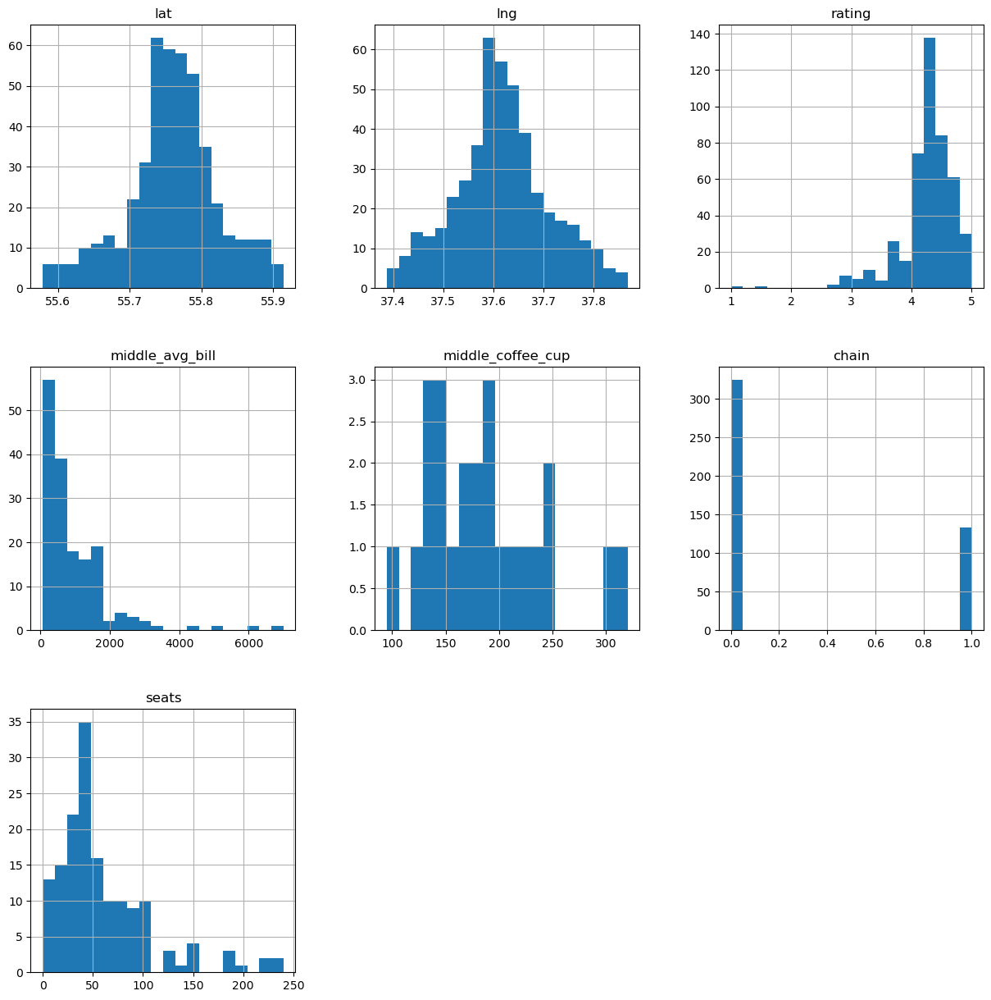

In [54]:
empty_streets_name.hist(bins=20, figsize=(15, 15));

Общие черты:  
- На улицах с одним объектом общепита доля несетевых заведений к сетевым больше, чем в среднем по всем улицам. 
- Количество посадочных мест меньше среднего - около 40-50  

В остальном существенных отличий нет.

In [55]:
print(int(data['middle_avg_bill'].mean()))
print(data['middle_avg_bill'].median())

958
750.0


In [56]:
print(int(empty_streets_name['middle_avg_bill'].mean()))
print(empty_streets_name['middle_avg_bill'].median())

959
625.0


По среднему чеку заведений существенных отличий также нет.

In [57]:
# создаём новую карту и хороплет 
m3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10.5)

Choropleth(
    geo_data=geo_json,
    data=ratings_by_districts,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Категории заведений по районам',
).add_to(m3)

def create_marker3(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['category']}"
    ).add_to(m3)

# применяем функцию для создания маркера ко всем строкам датафрейма
empty_streets_name.apply(create_marker3, axis=1)
    
# выводим карту
m3

На карте эти заведения рассеяны равномерно внутри каждого района и по районам, кроме Центрального - там по общей тенденции плотность выше. 

#### Средний чек по району

In [58]:
district_avg_bill = (data
                     .pivot_table(index=['district', 'lat', 'lng'], values='middle_avg_bill', aggfunc='median')
                     .reset_index())

In [59]:
district_avg_bill = (district_avg_bill
                     .groupby('district')['lat', 'lng', 'middle_avg_bill'].median().reset_index()
                     .sort_values(by='middle_avg_bill', ascending=False)
                    )
district_avg_bill

,district,lat,lng,middle_avg_bill
1,Западный административный округ,55.734177,37.489050,1000.0
5,Центральный административный округ,55.757224,37.619717,1000.0
4,Северо-Западный административный округ,55.809287,37.449247,700.0
2,Северный административный округ,55.823197,37.526040,650.0
7,Юго-Западный административный округ,55.666577,37.541783,600.0
0,Восточный административный округ,55.788543,37.750585,575.0
3,Северо-Восточный административный округ,55.847110,37.620093,500.0
8,Южный административный округ,55.664380,37.647898,500.0
6,Юго-Восточный административный округ,55.700827,37.739588,450.0


In [60]:
# создаём новую карту и хороплет 
m4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster4 = MarkerCluster().add_to(m4)

Choropleth(
    geo_data=geo_json,
    data=district_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний чек заведения по районам',
).add_to(m4)

def create_clusters4(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['district']} {row['middle_avg_bill']}",
    ).add_to(marker_cluster)

# применяем функцию для создания маркера ко всем строкам датафрейма
district_avg_bill.apply(create_clusters4, axis=1)
    
# выводим карту
m4

Центральный и Западный районы Москвы имеют самый высокий средний чек заведений общественного питания.  
Самый низкий средний чек в Северо-восточном, Южном и Юго-Восточном районах.  
Мы не можем дать рекомендации на основе этих данных, поскольку нужно также учитывать и другие параметры этих районов - стоимость аренды помещений, проходимость и т.п.

#### Выводы

**Выводы по итогу исследования данных заведений общественного питания в Москве на лето 2022:**    
- Самые популярные категории общественного питания - кафе, рестораны и кофейни. Меньше всего столовых и булочных.
- Несетевых заведений общественного питания почти в два раза больше, чем сетевых.
- Чаще всего сетевыми категориями являются кафе, рестораны и кофейни (также они самые популярные и в несетевом формате).
- Больше всего посадочных мест в ресторанах, барах, кофейнях и столовых. Диапазон среднего количества мест варьируется от 50 до 85.
- Больше всего крупных сетевых заведений в категории кофейня - Шоколадница, One price coffee и Cofix. Топ пиццерий - Домино'с пицца и Додо пицца. Самые крупные ресторанные сети - Prime и Теремок. Из прочих категорий: кафе Кулинарная лавка братьев караваевых, булочная Буханка и быстрое заведение - Крошка картошка.
- В Центральном районе заведений в два раза больше, чем в остальных районах. В Северо-западном - меньше всего. В остальных районах  общее количество заведений почти одинаковое. Процентное соотношение категорий внутри каждого района очень похоже.
- Рейтинг заведения не зависит ни от категории, ни от принадлежности к сети. В среднем 4,3 балла.
- Административный округ влияет на средний рейтинг заведения - в Центральном районе рейтинг в среднем на 0,2 балла выше, чем в остальных районах. В Южном округе средний рейтинг на 0,1 балла ниже, чем в большинстве районов (для определения является ли это существенной разницей необходимы дополнительные исследования).
- Большинство топовых улиц по количеству заведений - это улицы с очень большой длинной (8-9 и даже 16 км, это мы видим на карте). В Западном, Северо-Западном и Восточном округах нет улиц с большим количеством заведений питания.
- Общие черты улиц с всего одним заведением питания: доля несетевых заведений к сетевым больше, чем в среднем по всем улицам и количество посадочных мест меньше среднего - около 40-50. Больше отличий нет.
- Центральный и Западный районы Москвы имеют самый высокий средний чек заведений общественного питания. Самый низкий средний чек в Северо-восточном, Южном и Юго-Восточном районах (для определения значимости этих данных необходимы дополнительные исследования).

### ОТКРЫТИЕ КОФЕЙНИ

Проанализируем отдельно категорию кофейни

#### Количество кофеен и их распределение по районам

In [61]:
coffee_house = data.query('category == "кофейня"')

In [62]:
print('\033[1m' + 'Всего в Москве на 2022 год -',  coffee_house.shape[0], 'кофеен.'  + '\033[0m')

Всего в Москве на 2022 год - 1413 кофеен.


In [63]:
coffee_house['chain'].value_counts()

1    720
0    693
Name: chain, dtype: int64

**Общее количество сетевых и несетевых кофеен примерно равное.**

Для вывода количества кофеен по районам подготовим координаты районов:

In [64]:
coffee_house_join = district_avg_bill.groupby('district')['lat', 'lng', 'middle_avg_bill'].median()
coffee_house_join = coffee_house_join.drop(columns='middle_avg_bill', axis=0)

Добавим к таблице число кофеен по районам:

In [65]:
coffee_house_districts = (coffee_house
                          .pivot_table(index=['district'], values='name', aggfunc='count')
                          .reset_index()
                          .sort_values(by='name', ascending=False)
                         )

In [66]:
coffee_house_districts = coffee_house_districts.merge(coffee_house_join, how='inner', on='district')
coffee_house_districts

,district,name,lat,lng
0,Центральный административный округ,428,55.757224,37.619717
1,Северный административный округ,193,55.823197,37.526040
2,Северо-Восточный административный округ,159,55.847110,37.620093
3,Западный административный округ,150,55.734177,37.489050
4,Южный административный округ,131,55.664380,37.647898
5,Восточный административный округ,105,55.788543,37.750585
6,Юго-Западный административный округ,96,55.666577,37.541783
7,Юго-Восточный административный округ,89,55.700827,37.739588
8,Северо-Западный административный округ,62,55.809287,37.449247


In [67]:
# создаём новую карту и хороплет 
m5 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster5 = MarkerCluster().add_to(m5)

Choropleth(
    geo_data=geo_json,
    data=coffee_house_districts,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Количество кофеен по районам',
).add_to(m5)

def create_clusters5(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['district']} {row['name']}",
    ).add_to(marker_cluster)

# применяем функцию для создания маркера ко всем строкам датафрейма
coffee_house_districts.apply(create_clusters5, axis=1)
    
# выводим карту
m5

Существенно больше кофеен в Центральном районе (428).  
В Восточном, Юго-Восточном, Юго-Западном и Северо-Западном районах кофеен меньше всего (62-105).

#### Круглосуточные кофейни 

In [68]:
coffee_house['is_24/7'].value_counts()

False    1354
True       59
Name: is_24/7, dtype: int64

Из всех кофеен только 59 работают круглосуточно - это менее 5%. 

#### Топ-10 сетевых кофеен

In [69]:
coffee_house_chain = (coffee_house.query('chain == 1')
                      .pivot_table(index='name', values='chain', aggfunc='count')
                      .reset_index()
                      .sort_values(by='chain', ascending=False)
                      .head(10))
coffee_house_chain

,name,chain
155,шоколадница,119
59,one price coffee,71
32,cofix,65
116,кофепорт,42
13,cofefest,31
115,кофемания,22
12,cinnabon,20
136,правда кофе,13
52,krispy kreme,9
27,coffeekaldi's,8


In [70]:
fig = px.sunburst(coffee_house_chain, path=['name'], values='chain')
fig.update_layout(margin = dict(t=50, l=0, r=0, b=0))  # размер и положение графика по всем осям
fig.update_layout(title_text='Топ-10 кофейных сетей в Москве')
fig.show()

In [97]:
fig = px.histogram(coffee_house_chain, x='name', y='chain',
             hover_data=['chain', 'name'],   # hover показывает что отображать при наведении на график
             height=600, width=900,
             labels={'category':'категории'}, 
             title='Топ-10 кофейных сетей в Москве',
             color_discrete_sequence=['#f95d6a', '#d45087', '#a05195', '#665191', '#2f4b7c', '#003f5c'])
fig.update_layout(xaxis_title='категории', yaxis_title='заведения')
fig.update_layout(xaxis={'categoryorder':'total descending'}) # сортировка - нисходящие значения
fig.show()

#### Рейтинг кофеен по районам

In [72]:
coffee_house_rating = (coffee_house.pivot_table(index='district', values='rating', aggfunc='median')
                                   .sort_values(by='rating', ascending=False))
coffee_house_rating

,rating
district,
Восточный административный округ,4.3
Северный административный округ,4.3
Северо-Восточный административный округ,4.3
Северо-Западный административный округ,4.3
Центральный административный округ,4.3
Юго-Восточный административный округ,4.3
Юго-Западный административный округ,4.3
Южный административный округ,4.3
Западный административный округ,4.2


Средний рейтинг кофеен по районам одинаковый.

Посмотрим раздельно на рейтинг сетевых и несетевых кофеен:

In [73]:
district_rating_chain = (coffee_house.query('chain == 1')
                .pivot_table(index='district', values='rating', aggfunc=['count', 'median'])
                .reset_index())
district_rating_chain.columns = ['district', 'count', 'rating']
district_rating_chain = district_rating_chain.sort_values(by='count', ascending=False)
# удалим ошибочные заведения, не являющиеся сетевыми
district_rating_chain = district_rating_chain.query('count != 1')
district_rating_chain.head(10)

,district,count,rating
5,Центральный административный округ,221,4.3
2,Северный административный округ,97,4.2
1,Западный административный округ,93,4.2
3,Северо-Восточный административный округ,79,4.2
8,Южный административный округ,66,4.2
0,Восточный административный округ,51,4.2
7,Юго-Западный административный округ,50,4.3
4,Северо-Западный административный округ,34,4.2
6,Юго-Восточный административный округ,29,4.2


In [74]:
district_rating_no_chain = (coffee_house.query('chain == 0')
                .pivot_table(index='district', values='rating', aggfunc=['count', 'median'])
                .reset_index())
district_rating_no_chain.columns = ['district', 'count', 'rating']
district_rating_no_chain = district_rating_no_chain.sort_values(by='count', ascending=False)
district_rating_no_chain.head(10)

,district,count,rating
5,Центральный административный округ,207,4.40
2,Северный административный округ,96,4.40
3,Северо-Восточный административный округ,80,4.35
8,Южный административный округ,65,4.40
6,Юго-Восточный административный округ,60,4.35
1,Западный административный округ,57,4.30
0,Восточный административный округ,54,4.40
7,Юго-Западный административный округ,46,4.40
4,Северо-Западный административный округ,28,4.45


**Распределение сетевых и несетевых кофеен по районам почти одинаковое.  
Но рейтинг несетевых кофеен стабильно выше в среднем на 0,2 балла**.

Выведем рейтинг по брендам сетевых и несетевых кофеен:

In [75]:
rating_chain = (coffee_house.query('chain == 1')
                .pivot_table(index='name', values='rating', aggfunc=['count', 'median'])
                .reset_index())
rating_chain.columns = ['name', 'count', 'rating']
rating_chain = rating_chain.sort_values(by='count', ascending=False)
# удалим ошибочные заведения, не являющиеся сетевыми
rating_chain = rating_chain.query('count != 1')
rating_chain.head(10)

,name,count,rating
155,шоколадница,119,4.20
59,one price coffee,71,4.20
32,cofix,65,4.10
116,кофепорт,42,4.20
13,cofefest,31,4.00
115,кофемания,22,4.40
12,cinnabon,20,4.20
136,правда кофе,13,4.30
52,krispy kreme,9,4.30
27,coffeekaldi's,8,4.35


In [76]:
rating_chain.sort_values(by='rating', ascending=False).head(10)

,name,count,rating
85,барбариста,2,4.90
146,уголок,3,4.80
7,bodrero,4,4.75
108,кофе,3,4.70
47,i-cup,3,4.70
30,coffeesphere,3,4.70
135,пончики! выпекаем на месте,3,4.70
124,"может, кофе?",2,4.70
87,булочная № 5,2,4.65
122,маленькая пекарня журавлевых,2,4.65


Средний рейтинг у самых крупных сетевых кофеен - **4.2** . Самый высокий рейтинг у кофеен, имеющих в сети всего 2-3 заведения - **4.7** .

#### Стоимость чашки капучино в кофейне

In [77]:
print('Средняя стоимость чашки капучино', int(coffee_house['middle_coffee_cup'].median()), 'руб.')

Средняя стоимость чашки капучино 170 руб.


Посмотрим на распределение цены за чашку кофе подробнее:

In [78]:
fig = px.histogram(coffee_house.query('middle_coffee_cup < 400'), x='middle_coffee_cup',
             hover_data=['chain', 'name'],   # hover показывает что отображать при наведении на график
             height=600, width=700,
             labels={'category':'категории'}, 
             title='Средняя стоимость чашки капучино',
             color_discrete_sequence=['#f95d6a', '#d45087', '#a05195', '#665191', '#2f4b7c', '#003f5c'])
fig.update_layout(xaxis_title='стоимость', yaxis_title='количество')
#fig.update_layout(xaxis={'categoryorder':'total descending'}) # сортировка - нисходящие значения
fig.show()

Есть большое число кофеен со средней стоимостью чашки капучино 160 р, а также 260 р. Рассмотрим, связано ли это с брендом или местоположением. Разделим данные на кофейни с дорогой и дешевой чашкой капучино:

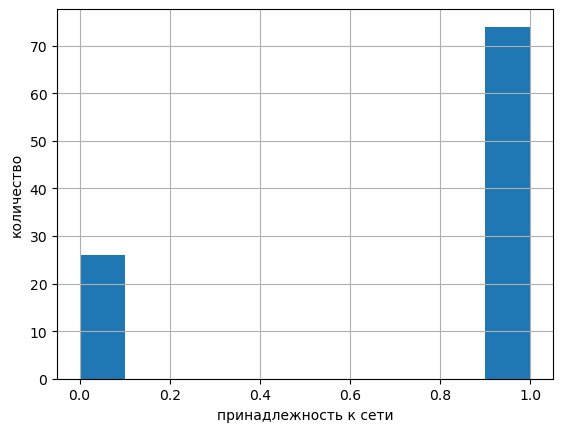

In [79]:
rich_cup = coffee_house.query('middle_coffee_cup > 240 & middle_coffee_cup < 300 ')
rich_cup['chain'].hist();
plt.xlabel('принадлежность к сети')
plt.ylabel('количество')
plt.show()

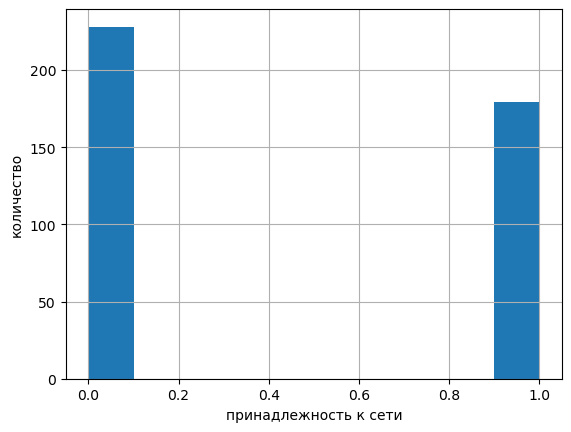

In [80]:
cheap_cup = coffee_house.query('middle_coffee_cup < 240')
cheap_cup['chain'].hist()
plt.xlabel('принадлежность к сети')
plt.ylabel('количество')
plt.show()

Среди заведений с дорогой чашкой капучино сетевых кофеен больше.

In [81]:
rich_cup['name'].value_counts().head(5)

шоколадница                  55
coffee bean                   3
skuratov, coffee roasters     3
кофе хауз                     2
даблби                        2
Name: name, dtype: int64

In [82]:
cheap_cup['name'].value_counts().head(5)

cofix            35
кофепорт         30
правда кофе       6
take and wake     6
krispy kreme      6
Name: name, dtype: int64

In [83]:
round(rich_cup.query('name == "шоколадница"')['middle_coffee_cup'].mean(), 0)

259.0

In [84]:
round(cheap_cup.query('name == "cofix"')['middle_coffee_cup'].mean(), 0)

69.0

In [85]:
rich_cup[['middle_coffee_cup', 'rating', 'seats']].median()

middle_coffee_cup    256.0
rating                 4.3
seats                 92.0
dtype: float64

In [86]:
cheap_cup[['middle_coffee_cup', 'rating', 'seats']].median()

middle_coffee_cup    150.0
rating                 4.3
seats                 78.0
dtype: float64

In [87]:
rich_cup['name'].shape[0]

100

In [88]:
cheap_cup.shape[0]

407

In [89]:
coffee_seats = rich_cup.query('seats < 300')
coffee_seats.groupby('chain')['seats'].median()

chain
0    92.0
1    80.0
Name: seats, dtype: float64

In [90]:
coffee_seats = cheap_cup.query('seats < 300')
coffee_seats.groupby('chain')['seats'].median()

chain
0    46.0
1    80.0
Name: seats, dtype: float64

Оказывается, в половине случаев капучино за 260 р. продают в Шоколаднице. В остальных случаях это в равном отношении сетевые и несетевые кофейни. Количество посадочных мест в несетевых кофейнях с дорогой чашкой капучино в среднем больше, чем с дешевой ценой (для точного анализа необходимо проверить корректность указанных мест в заведениях).

Изобразим заведения с дорогой и дешевой чашкой капучино на карте:

In [91]:
rich_cup['district'].value_counts()

Центральный административный округ         40
Западный административный округ            18
Северо-Восточный административный округ    10
Северный административный округ            10
Южный административный округ                7
Юго-Западный административный округ         6
Северо-Западный административный округ      4
Восточный административный округ            3
Юго-Восточный административный округ        2
Name: district, dtype: int64

In [92]:
cheap_cup['district'].value_counts()

Центральный административный округ         116
Северный административный округ             64
Северо-Восточный административный округ     50
Восточный административный округ            38
Южный административный округ                36
Юго-Восточный административный округ        31
Западный административный округ             29
Юго-Западный административный округ         26
Северо-Западный административный округ      17
Name: district, dtype: int64

In [93]:
# создаём новую карту и хороплет 
m6 = Map(location=[moscow_lat, moscow_lng], zoom_start=10.5)

Choropleth(
    geo_data=geo_json,
    data=rich_cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Заведения с дорогой стоимостью чашки капучино',
).add_to(m6)

def create_marker6(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['middle_coffee_cup']}"
    ).add_to(m6)

# применяем функцию для создания маркера ко всем строкам датафрейма
rich_cup.apply(create_marker6, axis=1)
    
# выводим карту
m6

In [94]:
(rich_cup.query('name != "шоколадница"')
 .groupby('district')['middle_coffee_cup'].median().sort_values(ascending=False))

district
Северо-Восточный административный округ    284.5
Южный административный округ               275.0
Западный административный округ            265.0
Центральный административный округ         265.0
Северо-Западный административный округ     260.0
Юго-Западный административный округ        250.0
Северный административный округ            245.0
Name: middle_coffee_cup, dtype: float64

In [95]:
# создаём новую карту и хороплет 
m7 = Map(location=[moscow_lat, moscow_lng], zoom_start=10.5)

Choropleth(
    geo_data=geo_json,
    data=cheap_cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Заведения с дешевой стоимостью чашки капучино',
).add_to(m7)

def create_marker7(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['middle_coffee_cup']}"
    ).add_to(m7)

# применяем функцию для создания маркера ко всем строкам датафрейма
cheap_cup.apply(create_marker7, axis=1)
    
# выводим карту
m7

In [96]:
cheap_cup.groupby('district')['middle_coffee_cup'].median().sort_values(ascending=False)

district
Центральный административный округ         167.0
Юго-Западный административный округ        162.5
Северный административный округ            150.0
Северо-Восточный административный округ    142.5
Западный административный округ            140.0
Южный административный округ               140.0
Северо-Западный административный округ     139.0
Восточный административный округ           132.0
Юго-Восточный административный округ       130.0
Name: middle_coffee_cup, dtype: float64

В обоих случаях количество заведений в Центральном районе в несколько раз больше, чем в остальных.  
Заведения с дорогой чашкой капучино практически не встречаются в Северо-Западном, Восточном и Юго-Восточном районах (но выборка слишком мала, чтобы по ней давать рекомендации). Заведения с дешевой чашкой капучино встречаются более равномерно во всех районах.

#### Выводы и рекомендации

- Рейтинг сетевых кофеен в среднем на 0,2 балла ниже, чем несетевых кофеен. Возможно, это связано с завышенными требованиями к популярным сетям или лояльным отношением к неизвестным кофейням.
- В Восточном, Юго-Восточном, Юго-Западном и Северо-Западном районах кофеен меньше всего (62-105) - необходимо исследовать причину.
- Рекомендуемая стоимость чашки капучино 150-170 р. (если вы не Шоколадница и не Cofix), принадлежность к сети или определенному району влияет на среднюю стоимость чашки капучино.
- Круглосуточный режим работы не характерен для кофеен.

В целом, предоставленных данных недостаточно для составление рекомендаций по открытию кофейни в Москве. Необходимо больше данных по среднему чеку, стоимости аренды, площади заведений, проходимости и т.д. 